# Рынок заведений общественного питания Москвы

## Информация о проекте

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

Постарайтесь сделать презентацию информативной и лаконичной. Её структура и оформление сильно влияют на восприятие информации читателями вашего исследования. Выбирать инструменты (matplotlib, seaborn и другие) и типы визуализаций вы можете самостоятельно.
Вам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

## План действий

1. Загрузить данные и подготовить их к анализу.
2. Выполнить предобработку данных.
3. Анализ данных. 
4. Детализируем исследование: открытие кофейни. 
5. Подготовка презентации

## Описание данных

Файл moscow_places.csv:
- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
  * «Средний счёт: 1000–1500 ₽»;
  * «Цена чашки капучино: 130–220 ₽»;
  * «Цена бокала пива: 400–600 ₽».
и так далее;
-  middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
  * Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
  * Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
  * Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
  * Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
  * Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
  * Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
  * 0 — заведение не является сетевым
  * 1 — заведение является сетевым
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.

## Предобработка данных

### Импортирование библиотек и вывод данных

In [1]:
# импортируем библиотеки:
import os
import pandas as pd
import numpy as np
import scipy.stats as stats
import seaborn as sns
import requests
import json
from folium import Map, Choropleth
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster
# импортируем собственные иконки
from folium.features import CustomIcon
from datetime import datetime, timedelta
from matplotlib import pyplot as plt
from pandas.plotting import register_matplotlib_converters
from plotly import graph_objects as go
from statsmodels.stats.proportion import proportions_ztest

# закрепим формат float:
pd.set_option('display.float_format', '{:,.2f}'.format)

# уберем предупреждения:
import warnings
warnings.simplefilter('ignore')

# сброс ограничений на количество выводимых данных:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

# конвертеры, которые позволяют использовать типы pandas в matplotlib  
register_matplotlib_converters()

# выберем единый стиль для графиков в проекте
plt.style.use('ggplot')

### Загрузка данных и подготовка их к анализу

In [2]:
# напишем функцию для вывода данных
def read_file(file_name):
    path1 = os.path.join('/datasets', file_name)
    path2 = os.path.join(file_name)
    if os.path.exists(path1):
        data = pd.read_csv(path1)
        return data
    elif os.path.exists(path2):
        data = pd.read_csv(path2)
        return data
    else:
        print('File is not found')

In [3]:
# загрузим данные
file_name = 'moscow_places.csv'
df = read_file(file_name)

In [5]:
# создадим фукнцию для вывода всех необходимых характеристик данных:
def analize(table):
    display(table.head(10))
    display(table.info())
    display(table.describe())
    display('Число пропусков:', table.isnull().sum())
    display('Число дубликатов:', table.duplicated().sum())

In [6]:
analize(df)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,"1,550.00",NaN,0,4.00
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,"1,000.00",NaN,0,45.00
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.89,37.51,4.60,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.89,37.52,4.40,средние,Средний счёт:199 ₽,199.00,NaN,0,45.00
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.89,37.52,4.70,средние,Средний счёт:200–300 ₽,250.00,NaN,0,45.00
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.54,4.80,средние,Средний счёт:от 500 ₽,500.00,NaN,0,79.00
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.88,37.52,4.30,средние,Средний счёт:1000–1200 ₽,"1,100.00",NaN,0,65.00


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


None

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,"8,406.00","8,406.00","8,406.00","3,149.00",535.00,"8,406.00","4,795.00"
mean,55.75,37.61,4.23,958.05,174.72,0.38,108.42
std,0.07,0.10,0.47,"1,009.73",88.95,0.49,122.83
min,55.57,37.36,1.00,0.00,60.00,0.00,0.00
25%,55.71,37.54,4.10,375.00,124.50,0.00,40.00
50%,55.75,37.61,4.30,750.00,169.00,0.00,75.00
75%,55.80,37.66,4.40,"1,250.00",225.00,1.00,140.00
max,55.93,37.87,5.00,"35,000.00","1,568.00",1.00,"1,288.00"


'Число пропусков:'

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

'Число дубликатов:'

0

Выводы: 
- с категориями данных все ок, 
- дубликатов нет, 
- пропуски есть hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats. avg_bill, middle_avg_bill, middle_coffee_cup между собой связаны, может быть заполнено либо middle_avg_bill, либо middle_avg_bill. Что-то делать с данными пропусками нет смысла. 

### Предобработка данных

In [7]:
# создадим столбец street с названиями улиц из столбца с адресом
df['street'] = df['address'].str.split(', ').str[1]

In [8]:
# создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
# логическое значение True — если заведение работает ежедневно и круглосуточно;
# логическое значение False — в противоположном случае.
df['is_24/7'] = df['hours'].str.contains('ежедневно, круглосуточно')
df.head(2)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,"1,550.00",NaN,0,4.00,улица Дыбенко,False


## Анализ данных

Какие категории заведений представлены в данных? Исследуем количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построим визуализации. Ответим на вопрос о распределении заведений по категориям.

In [9]:
# подсчет количества каждой категории
counts = df['category'].value_counts()

# расчет долей от общего для каждой категории
category_shares = (counts / counts.sum()) * 100

# создание общей таблицы с показателями
summary_table = pd.DataFrame({'count': counts, 'ratio': category_shares}).reset_index()
summary_table['ratio'] = summary_table['ratio'].apply(lambda x: f'{x:.1f}%')

display(summary_table)

,index,count,ratio
0,кафе,2378,28.3%
1,ресторан,2043,24.3%
2,кофейня,1413,16.8%
3,"бар,паб",765,9.1%
4,пиццерия,633,7.5%
5,быстрое питание,603,7.2%
6,столовая,315,3.7%
7,булочная,256,3.0%


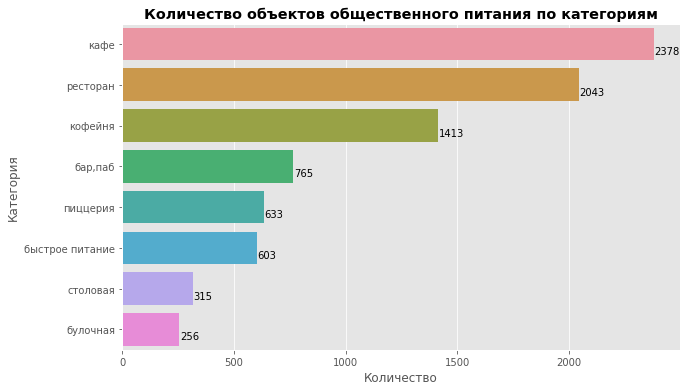

In [10]:
# построим bar chart числа заведений по категориям
plt.figure(figsize=(10, 6))
ax = sns.barplot(x=counts.values, y=counts.index)
for i, v in enumerate(counts.values):
    ax.text(v + 3, i + .25, str(v), color='black')
ax.set_title('Количество объектов общественного питания по категориям', fontweight='bold')
ax.set_xlabel('Количество')
ax.set_ylabel('Категория')
plt.show()

**Выводы:** Больше всего кафе 2378 и кофеен 1423, также много ресторанов 2043.

Исследуем количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Проанализируем результаты и сделайте выводы.

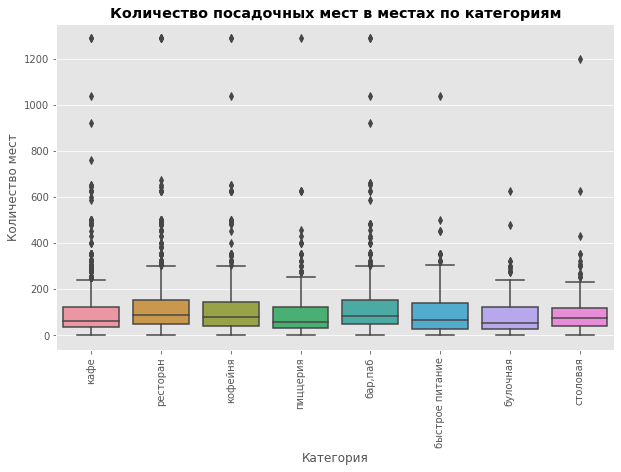

In [11]:
# используем boxplot для построения графика
plt.figure(figsize=(10, 6))
ax = sns.boxplot(x='category', y='seats', data=df)
ax.set_title('Количество посадочных мест в местах по категориям', fontweight='bold')
ax.set_xlabel('Категория')
ax.set_ylabel('Количество мест')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
plt.show()

**Вывод:** В целом средние значения по категориям практически одинаковые, однако выбросов больше всего у кафе и баров/пабов. 

Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?

In [12]:
# сгруппируем по 'category' и суммируем столбец 'chain' 
chain_counts = df.groupby('category')['chain'].sum()

# сгруппируем по 'category' и посчитаем число заведений
total_counts = df.groupby('category')['chain'].count()

# посчитаем долю сетевых заведений
chain_share = chain_counts / total_counts * 100

# создание общей таблицы с показателями
summary_table = pd.DataFrame({'chain': chain_counts, 'chain_total_ratio': chain_share}).sort_values(
                                by='chain_total_ratio',ascending=False).reset_index()

display(summary_table)

,category,chain,chain_total_ratio
0,булочная,157,61.33
1,пиццерия,330,52.13
2,кофейня,720,50.96
3,быстрое питание,232,38.47
4,ресторан,730,35.73
5,кафе,779,32.76
6,столовая,88,27.94
7,"бар,паб",169,22.09


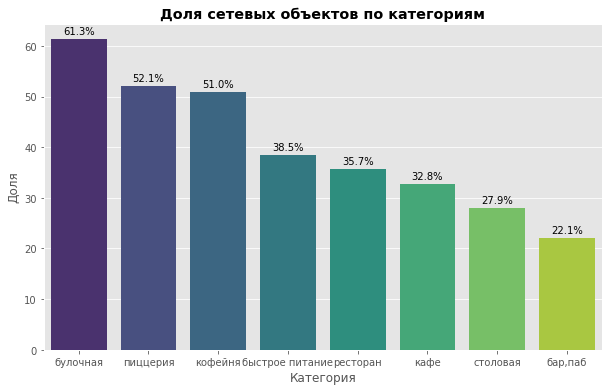

In [13]:
# построим barplot числа заведений по категориям
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='category', y='chain_total_ratio', data=summary_table, palette='viridis')

# добавим значения на barplot
for i, v in enumerate(summary_table['chain_total_ratio']):
    ax.text(i, v + 1, f'{v:.1f}%', ha='center')

# Кастомизируем график
ax.set_title('Доля сетевых объектов по категориям', fontweight='bold')
ax.set_xlabel('Категория')
ax.set_ylabel('Доля')

plt.show()

**Вывод:** Сетевых заведений больше всего среди булочных, пиццерий и кофеен. 

Сгруппируем данные по названиям заведений и найдем топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Построим подходящую для такой информации визуализацию. Знакомы ли нам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?

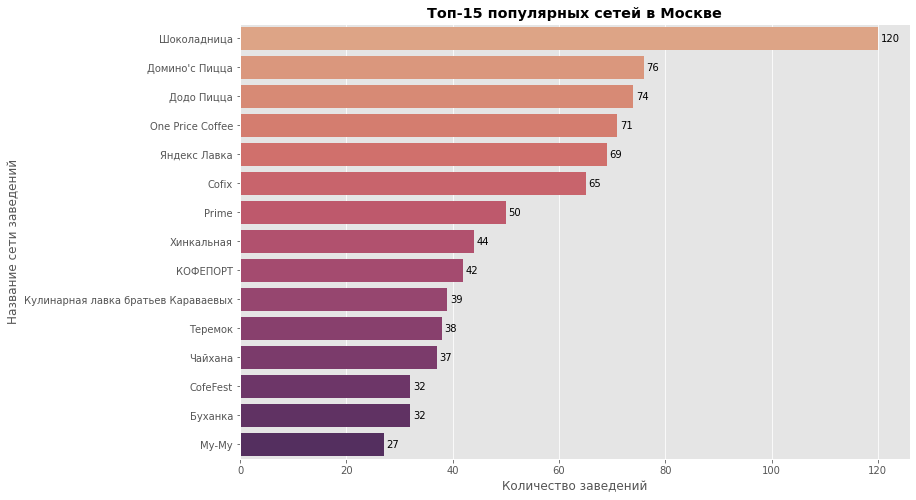

In [14]:
# отфильтруем сетевые заведения в Москве
moscow_chains = df[df['chain'] == 1]

# сгруппируем данныем по названию заведения и числу заведения, выделив топ-15
chain_counts = moscow_chains.groupby('name').size().reset_index(name='counts')
chain_counts = chain_counts.sort_values(by='counts', ascending=False).head(15)

# построим bar plot топ-15 популярных сетей в Москве
plt.figure(figsize=(12, 8))
sns.barplot(x='counts', y='name', data=chain_counts, palette='flare')

# добавим значения на график
for i, v in enumerate(chain_counts['counts']):
    plt.annotate(str(v), xy=(v + 0.5, i), ha='left', va='center')

# кастомизируем barplot
plt.title('Топ-15 популярных сетей в Москве', fontweight='bold')
plt.xlabel('Количество заведений')
plt.ylabel('Название сети заведений')
plt.show()

**Выводы:** Все сети знакомые, их объединяет, что практически все они кафе или пиццерии. 

Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [15]:
# сгруппируем данные по району и категории и посчитаем число заведений
district_category_counts = df.groupby(['district', 'category']).agg({'name': 'count'}).reset_index()

# повернем данные так, чтобы район отображался в виде строк, категория — в виде столбцов, а количество — в виде значений.
district_category_counts_pivot = district_category_counts.pivot(index='district', columns='category', 
                                                                values='name').fillna(0)

# добавим столбец с общим числом заведений по районам
district_category_counts_pivot['total'] = district_category_counts_pivot.sum(axis=1)

# отсортируем данные в обратном порядке
district_category_counts_pivot = district_category_counts_pivot.sort_values('total', ascending=False)

# добавим столбец с долей по количеству заведений в округах
district_category_counts_pivot['total_ratio'] = (district_category_counts_pivot['total'] / 
                        district_category_counts_pivot['total'].sum() * 100)

district_category_counts_pivot['total_ratio'] = (district_category_counts_pivot['total_ratio'].
                                                                    apply(lambda x: f'{x:.1f}%'))

district_category_counts_pivot

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total,total_ratio
district,,,,,,,,,,
Центральный административный округ,364,50,87,464,428,113,670,66,2242,26.7%
Северный административный округ,68,39,58,235,193,77,189,41,900,10.7%
Южный административный округ,68,25,85,264,131,73,202,44,892,10.6%
Северо-Восточный административный округ,63,28,82,269,159,68,182,40,891,10.6%
Западный административный округ,50,37,62,239,150,71,218,24,851,10.1%
Восточный административный округ,53,25,71,272,105,72,160,40,798,9.5%
Юго-Восточный административный округ,38,13,67,282,89,55,145,25,714,8.5%
Юго-Западный административный округ,38,27,61,238,96,64,168,17,709,8.4%
Северо-Западный административный округ,23,12,30,115,62,40,109,18,409,4.9%


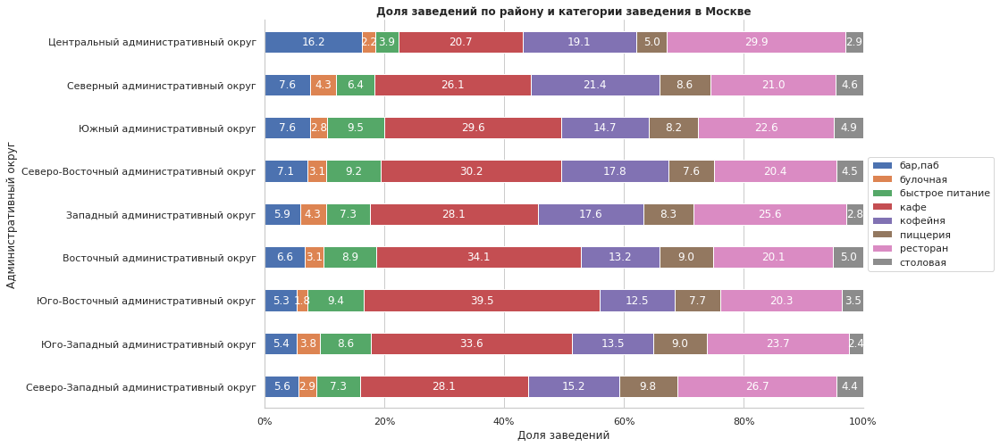

In [16]:
# рассчитаем долю каждой категории в каждом районе
district_category_shares = district_category_counts_pivot.iloc[:, :-2].div(
    district_category_counts_pivot['total'], axis=0)

# построим горизонтальный stacked bar chart
sns.set(style='whitegrid')
ax = district_category_shares.plot(kind='barh', stacked=True, figsize=(12, 8))
ax.set_xlabel('Доля заведений')
ax.set_ylabel('Административный округ')
ax.set_title('Доля заведений по району и категории заведения в Москве', fontweight='bold')
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
sns.despine()

# изменим x-axis, чтобы показала все значения
ax.set_xlim([0, 1])

# отобразим на шкале значения в процентах
vals = ax.get_xticks()
ax.set_xticklabels(['{:,.0%}'.format(x) for x in vals])

# инвертируем y-axis 
ax.invert_yaxis()

# добавим значения на график
for i, (category, row) in enumerate(district_category_shares.iterrows()):
    x_offset = 0
    for j, value in enumerate(row):
        if value > 0:
            ax.annotate('{:.1f}'.format(value * 100), xy=(x_offset + value / 2, i),
                        xytext=(0, 0), textcoords='offset points', ha='center', va='center', color='white')
            x_offset += value

plt.show()

**Выводы:**
- Больше всего заведений в ЦАО - вдвое больше любого другого округа.
- В ЦАО больше всего ресторанов, кафе и баров/пабов. 
- В остальных округах распределение заведений приблизительно одинаковое - больше всего ресторанов и кафе. 
- На общем фоне выделяется только СЗАО - там меньше всего любых заведений.

Визуализируем распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

In [18]:
# подсчет среднего рейтинга по каждой категории
counts = df.groupby(['category']).agg({'rating': 'mean'}).sort_values(by='rating', ascending=False).reset_index()

counts

,category,rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


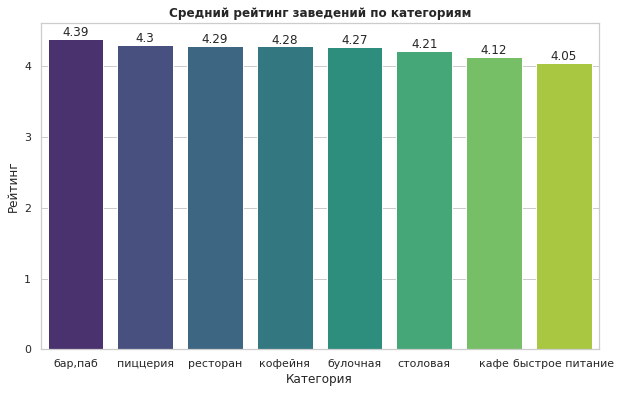

In [19]:
# используем barplot для построения графика
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='category', y='rating', data=counts, palette='viridis')

# добавляем значения на barplot
for i, v in enumerate(counts['rating']):
    ax.annotate(str(round(v, 2)), xy=(i, v), ha='center', va='bottom')

# кастомизируем график
ax.set_title('Средний рейтинг заведений по категориям', fontweight='bold')
ax.set_xlabel('Категория')
ax.set_ylabel('Рейтинг')

plt.show()

**Вывод:** Из общей картины выбивается быстрое питание - хуже всего рейтинг, также похуже рейтинги у кафе. Лучше всего рейтинг у баров/пабов

Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson.

In [20]:
# для каждого округа посчитаем средний рейтинг заведений, которые находятся на его территории
rating_df = df.groupby(['district']).agg({'rating': 'mean'}).sort_values(by='rating', ascending=False).reset_index()

rating_df

,district,rating
0,Центральный административный округ,4.38
1,Северный административный округ,4.24
2,Северо-Западный административный округ,4.21
3,Южный административный округ,4.18
4,Западный административный округ,4.18
5,Восточный административный округ,4.17
6,Юго-Западный административный округ,4.17
7,Северо-Восточный административный округ,4.15
8,Юго-Восточный административный округ,4.10


In [21]:
# проверяем файл с геоданными и сохраняем в переменной
url = 'https://drive.google.com/uc?id=1xCH5ZZzAxkKhMSkcvvqJYFowc4vAZjiz'
response = requests.get(url)
state_geo = json.loads(response.content)

print(json.dumps(state_geo, indent=2, ensure_ascii=False, sort_keys=True))

{
  "features": [
    {
      "geometry": {
        "coordinates": [
          [
            [
              [
                37.8756653,
                55.825342400000004
              ],
              [
                37.876001599999995,
                55.8249027
              ],
              [
                37.8730967,
                55.8237936
              ],
              [
                37.8689418,
                55.8228697
              ],
              [
                37.869206999999996,
                55.822363200000005
              ],
              [
                37.868322500000005,
                55.822211100000004
              ],
              [
                37.867472,
                55.823703
              ],
              [
                37.86851090000001,
                55.82391880000001
              ],
              [
                37.87046039999999,
                55.8242706
              ],
              [
                37.87172779999

In [22]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='BuGn',
    fill_opacity=0.5,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

**Вывод:** Выше всего рейтинг в ЦАО, хуже всего в СВАО и ЮВАО. 

Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [23]:
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    # сохраняем URL-адрес изображения со значком торгового центра с icons8,
    # это путь к файлу на сервере icons8
    icon_url = 'https://img.icons8.com/fluency/48/null/restaurant-.png'   
    # создаём объект с собственной иконкой размером 30x30
    icon = CustomIcon(icon_url, icon_size=(30, 30))
    
    # создаём маркер с иконкой icon и добавляем его в кластер
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
        icon=icon,
    ).add_to(marker_cluster)

# применяем функцию для создания кластеров к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

Найдем топ-15 улиц по количеству заведений. Построим график распределения количества заведений и их категорий по этим улицам. 

In [25]:
# найдем топ 15 улиц по количеству заведений
top_15_streets = df['street'].value_counts().head(15)

# выделим заведения только на этих улицах
df_top_streets = df[df['street'].isin(top_15_streets.index)]

# сгруппируем данные по улицам и категории и посчитаем число заведений
df_top_streets = df_top_streets.groupby(['street', 'category']).agg({'name': 'count'}).reset_index()

# повернем данные так, чтобы район отображался в виде строк, категория — в виде столбцов, а количество — в виде значений.
df_top_streets_pivot = df_top_streets.pivot(index='street', columns='category', 
                                                                values='name').fillna(0)

# добавим столбец с общим числом заведений по улицам
df_top_streets_pivot['total'] = df_top_streets_pivot.sum(axis=1)

# отсортируем данные в обратном порядке
df_top_streets_pivot = df_top_streets_pivot.sort_values('total', ascending=False)

# добавим столбец с долей по количеству заведений в округах
df_top_streets_pivot['total_ratio'] = (df_top_streets_pivot['total'] / 
                                       df_top_streets_pivot['total'].sum() * 100)

df_top_streets_pivot['total_ratio'] = (df_top_streets_pivot['total_ratio'].
                                                                    apply(lambda x: f'{x:.1f}%'))

df_top_streets_pivot

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total,total_ratio
street,,,,,,,,,,
проспект Мира,12.00,4.00,21.00,53.00,36.00,11.00,45.00,2.00,184.00,14.6%
Профсоюзная улица,6.00,4.00,15.00,35.00,18.00,15.00,26.00,3.00,122.00,9.7%
проспект Вернадского,7.00,1.00,12.00,25.00,16.00,12.00,33.00,2.00,108.00,8.6%
Ленинский проспект,10.00,3.00,2.00,26.00,23.00,5.00,33.00,5.00,107.00,8.5%
Ленинградский проспект,15.00,4.00,2.00,12.00,25.00,9.00,25.00,3.00,95.00,7.6%
Дмитровское шоссе,6.00,2.00,10.00,23.00,11.00,8.00,24.00,4.00,88.00,7.0%
Каширское шоссе,2.00,0.00,10.00,20.00,16.00,5.00,19.00,5.00,77.00,6.1%
Варшавское шоссе,6.00,0.00,7.00,18.00,14.00,4.00,20.00,7.00,76.00,6.0%
Ленинградское шоссе,5.00,2.00,5.00,13.00,13.00,3.00,26.00,3.00,70.00,5.6%


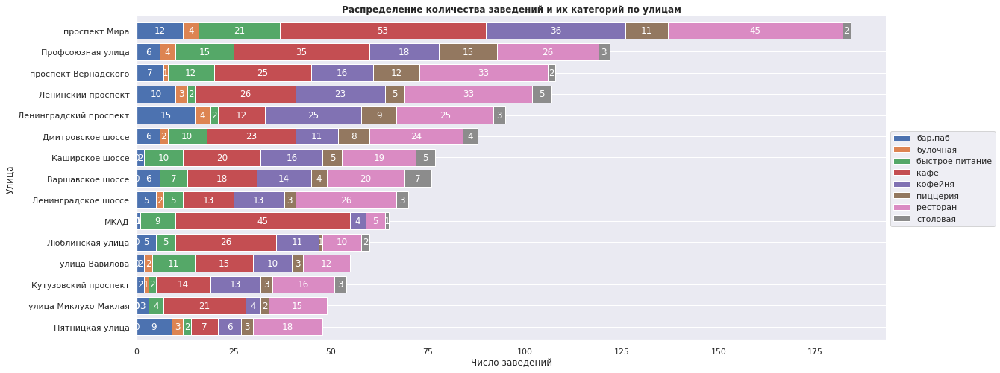

In [26]:
# построим горизонтальный stacked bar chart
sns.set(style='darkgrid')
ax = df_top_streets_pivot.iloc[:, :-2].plot(kind='barh', stacked=True, figsize=(18, 8), width=0.8)
ax.set_xlabel('Число заведений')
ax.set_ylabel('Улица')
ax.set_title('Распределение количества заведений и их категорий по улицам', fontweight='bold')
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
sns.despine()

# добавляем значения на barplot
for p in ax.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy() 
    ax.text(x + width / 2,
            y + height / 2,
            f'{width:.0f}',
            horizontalalignment='center',
            verticalalignment='center',
            color='white')

# инвертируем y-axis 
ax.invert_yaxis()

plt.show()

**Вывод:**
- Больше всего заведений на проспекте Мира, далее идут проспект Вернадского, Ленинский проспект и Профсоюзная улица,
- На Мкад много кафе
- на Ленинском проспекте выделяются рестораны

Найдем улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [27]:
# найдем количество заведений на улицах
street_counts = df.groupby('street').agg({'name': 'count'}).reset_index()

# выберем заведения, которых только по одному на улице
one_establishment_streets = street_counts[street_counts['name'] == 1]['street']
one_establishment_streets

# выделим заведения на этих улицах
one_establishment_data = df[df['street'].isin(one_establishment_streets)]

one_establishment_data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
15,Дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.89,37.49,4.10,средние,Средний счёт:300–500 ₽,400.00,NaN,0,180.00,улица Бусиновская Горка,False
21,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.46,4.50,NaN,NaN,NaN,NaN,0,NaN,Прибрежный проезд,False
25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.88,37.46,4.30,NaN,NaN,NaN,NaN,1,NaN,парк Левобережный,False
58,Coffeekaldi's,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.90,37.57,4.10,средние,Средний счёт:500–800 ₽,650.00,NaN,1,NaN,Угличская улица,False
60,Чебуречная история,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.90,37.57,4.90,NaN,NaN,NaN,NaN,1,NaN,ландшафтный заказник Лианозовский,False


**Вывод:** Это какие-то единичные заведения на небольших улицах. 

Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?

In [28]:
# рассчитаем медиану столбца middle_avg_bill для каждого округа
district_median = df.groupby('district')['middle_avg_bill'].median()

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
m_2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=district_median,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианное значение средних чеков заведений по районам',
).add_to(m_2)

# выводим карту
m_2

**Вывод:** Медианный чек в ЦАО и ЗАО самый высокий. Удаленность от центра не влияет на средний чек, влияет больше сам район и кто в нем проживает. 

Исследуем особенности заведений с плохими рейтингами, средние чеки в таких местах и распределение по категориям заведений.

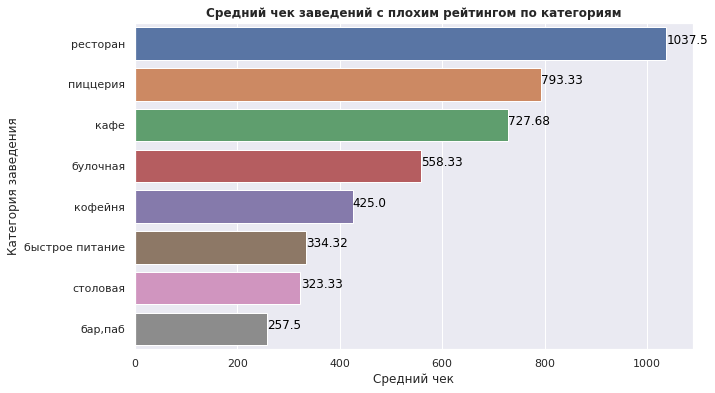

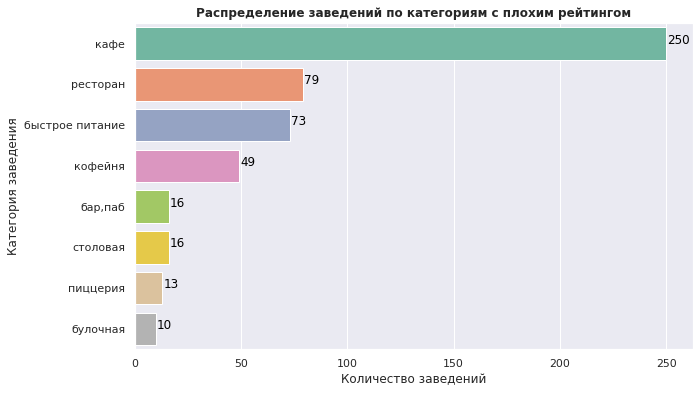

In [29]:
# установим порог для плохих оценок
rating_threshold = 3.5

# отфильтруем данные по установленному порогу
poor_ratings = df[df['rating'] <= rating_threshold]

# рассчитаем средний чек по категориям заведений с плохим рейтингом
average_check = poor_ratings.groupby('category')['middle_avg_bill'].mean()

# отсортируем значения по убыванию
average_check = average_check.sort_values(ascending=False)

# построим barplot среднего чека по категориям
plt.figure(figsize=(10,6))
sns.barplot(x=average_check.values, y=average_check.index)
plt.title('Средний чек заведений с плохим рейтингом по категориям', fontweight='bold')
plt.xlabel('Средний чек')
plt.ylabel('Категория заведения')

# добавим значения
ax = plt.gca()
for i, v in enumerate(average_check.values):
    ax.text(v + 0.5, i, str(round(v, 2)), color='black')

plt.show()
print()

# построим barplot распределения категорий заведений с плохим рейтингом
sns.set_palette('Set2')
plt.figure(figsize=(10,6))
category_counts = poor_ratings['category'].value_counts()
sns.barplot(x=category_counts.values, y=category_counts.index)
plt.title('Распределение заведений по категориям с плохим рейтингом', fontweight='bold')
plt.xlabel('Количество заведений')
plt.ylabel('Категория заведения')

# добавим значения
ax = plt.gca()
for i, v in enumerate(category_counts.values):
    ax.text(v + 0.5, i, str(v), color='black')

plt.show()

**Выводы:**
- средний чек заведений с плохим рейтингом выше всего в ресторанах и пиццериях,
- средний чек ниже всего в пабах,
- большинство заведений с плохим рейтингом - кафе. 

### Общие выводы

- В датасете больше всего кафе 2378 и ресторанов 2043, также много кофеен 1423,
- В целом среднее количество посадочных мест по категориям практически одинаковое, однако выбросов (большое количество посадочных мест) больше всего у кафе и баров/пабов,
- Сетевых заведений больше всего среди булочных, пиццерий и кофеен,
- Практически все сетевые заведения - кафе или пиццерии,
- Больше всего заведений в ЦАО - вдвое больше любого другого округа,
- В ЦАО больше всего ресторанов, кафе и баров/пабов,
- В части рейтинга заведений: он хуже всего у заведений быстрого питания и кафе. Лучше всего рейтинг у баров/пабов,
- В части округов выше всего рейтинг в ЦАО, хуже всего в СВАО и ЮВАО,
- По количеству больше всего заведений на проспекте Мира, далее идут проспект Вернадского, Ленинский проспект и Профсоюзная улица,
- Медианный чек в ЦАО и ЗАО самый высокий. Удаленность от центра не влияет на средний чек, влияет больше сам район и кто в нем проживает,
- Средний чек заведений с плохим рейтингом выше всего в ресторанах и пиццериях,
- 50% заведений с плохим рейтингом - кафе.

## Детализируем исследование: открытие кофейни

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуйте определить, осуществима ли мечта клиентов.

Ответьте на следующие вопросы:
- Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
- Есть ли круглосуточные кофейни?
- Какие у кофеен рейтинги? Как они распределяются по районам?
- На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

Постройте визуализации. Попробуйте дать рекомендацию для открытия нового заведения. Это творческое задание: здесь нет правильного или неправильного ответа, но ваше решение должно быть чем-то обосновано. Объяснить свою рекомендацию можно текстом с описанием или маркерами на географической карте.

Ответим на следующие вопросы:
- Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

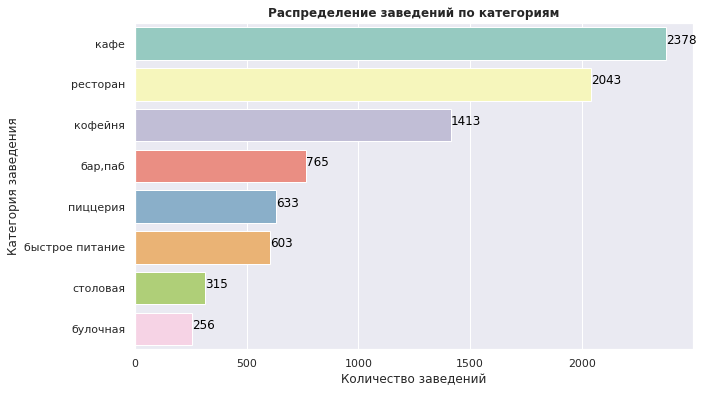

In [30]:
# построим barplot распределения категорий заведений
sns.set_palette('Set3')
plt.figure(figsize=(10,6))
category_counts = df['category'].value_counts()
sns.barplot(x=category_counts.values, y=category_counts.index)
plt.title('Распределение заведений по категориям', fontweight='bold')
plt.xlabel('Количество заведений')
plt.ylabel('Категория заведения')

# добавим значения
ax = plt.gca()
for i, v in enumerate(category_counts.values):
    ax.text(v + 0.5, i, str(v), color='black')
    
plt.show()

- В датасете 1413 кофеен. 


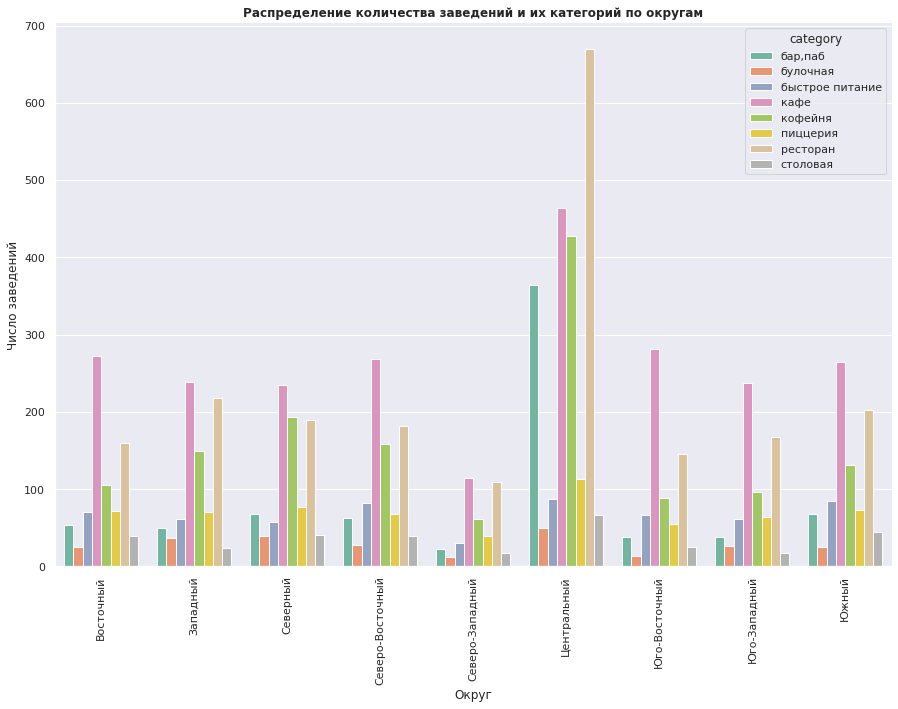

In [31]:
# посчитаем число заведений 
street_category_counts = df.groupby(['district', 'category']).agg({'name': 'count'}).reset_index()

# создадим составной bar chart количества заведений и их категорий по округам
plt.figure(figsize=(15,10))
ax = sns.barplot(data=street_category_counts, x='district', y='name', hue='category', palette='Set2')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
ax.set_xlabel('Округ')
ax.set_ylabel('Число заведений')
ax.set_title('Распределение количества заведений и их категорий по округам', fontweight='bold')
sns.despine()
labels = [label.get_text().split(' ')[0] for label in ax.get_xticklabels()]
ax.set_xticklabels(labels)

plt.show()

**Вывод:** Больше всего кофеен в ЦАО, далее идут ЮВАО, СВАО и ВАО. 

Есть ли круглосуточные кофейни?

In [32]:
# отфильтруем круглосуточные кофейни
count_24h_coffee_shops = len(df[(df['category'] == 'кофейня') & (df['is_24/7'] == 1)])
total_coffee_shops = df[df['category'] == 'кофейня'].shape[0]
print(f"Число круглосуточных кофеен: {count_24h_coffee_shops} - это {'{:.1%}'.format(count_24h_coffee_shops/total_coffee_shops)} от общего числа кофеен.")

Число круглосуточных кофеен: 59 - это 4.2% от общего числа кофеен.


Какие у кофеен рейтинги? Как они распределяются по районам?

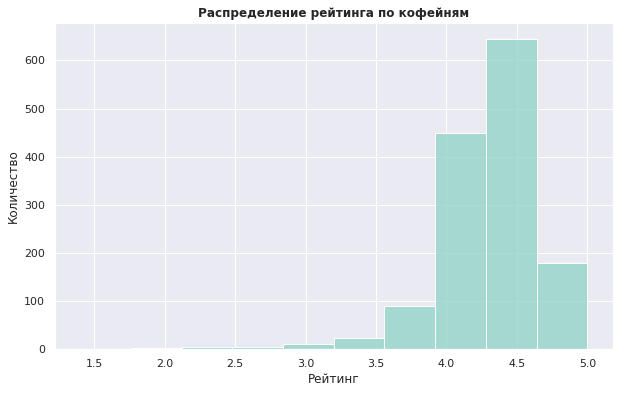

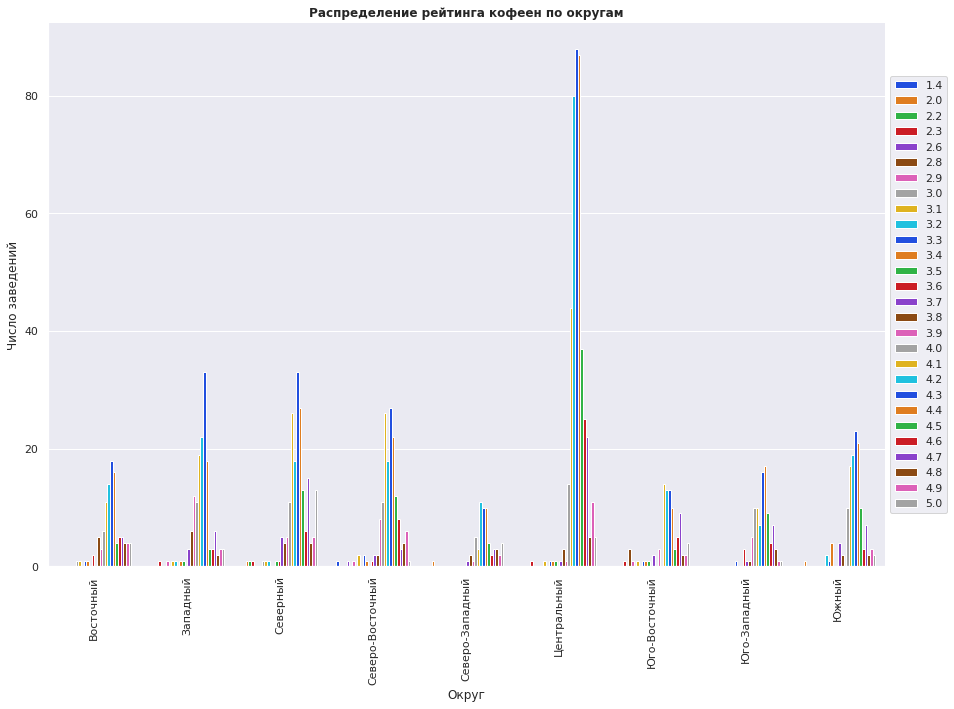

In [33]:
# отфильтруем данные по кофейня 
coffee_df = df[df['category'] == 'кофейня']

# построим распределение рейтинга по кофейням
plt.figure(figsize=(10,6))
sns.histplot(data=coffee_df, x='rating', bins=10)
plt.title('Распределение рейтинга по кофейням', fontweight='bold')
plt.xlabel('Рейтинг')
plt.ylabel('Количество')
plt.show()
print()

# рассчитаем число кофеен по районам и рейтингу
coffee_ratings_df = coffee_df.groupby(['district', 'rating']).agg({'name': 'count'}).reset_index()

# создадим составной bar chart количества заведений и их категорий по округам
plt.figure(figsize=(15,10))
ax = sns.barplot(data=coffee_ratings_df, x='district', y='name', hue='rating', palette='bright')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
ax.set_xlabel('Округ')
ax.set_ylabel('Число заведений')
ax.set_title('Распределение рейтинга кофеен по округам', fontweight='bold')
labels = [label.get_text().split(' ')[0] for label in ax.get_xticklabels()]
ax.set_xticklabels(labels)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
sns.despine()
plt.show()

**Вывод:** Самый популярный рейтинг у кофеен 4.5. Лучше всего рейтинг в ЗАО, САО и СВАО. 

На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

count     521.00
mean      175.06
std        89.75
min        60.00
25%       124.00
50%       170.00
75%       225.00
max     1,568.00
Name: middle_coffee_cup, dtype: float64

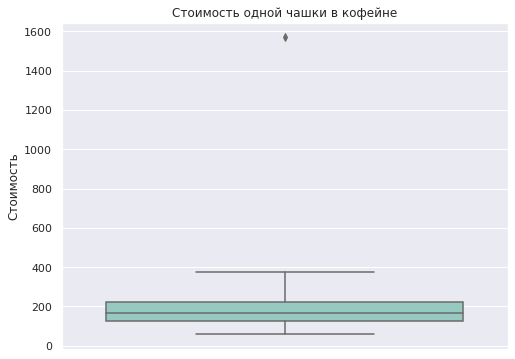

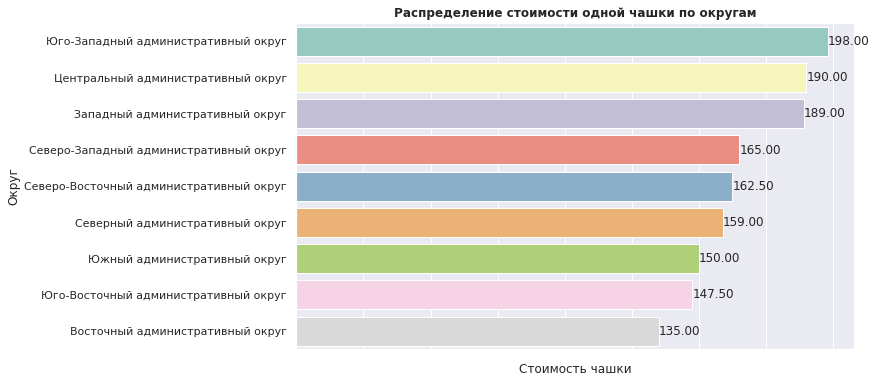

In [34]:
# выведем статистические данные по столбцу middle_coffee_cup
plt.figure(figsize=(8,6))
display(coffee_df['middle_coffee_cup'].describe())
ax = sns.boxplot(y=df['middle_coffee_cup'])
ax.set_title('Стоимость одной чашки в кофейне')
ax.set_xlabel('')
ax.set_ylabel('Стоимость')
plt.show()
print()

# рассчитаем медианную стоимость чашки по округам
coffee_cups = coffee_df.groupby(['district']).agg({'middle_coffee_cup': 'median'}).sort_values(
                                                  by='middle_coffee_cup', ascending=False).reset_index()

# построим график распределения медианной стоимости чашки по округам
plt.figure(figsize=(10,6))
ax = sns.barplot(x ='middle_coffee_cup', y='district', data=coffee_cups)
ax.set_title('Распределение стоимости одной чашки по округам', fontweight='bold')
ax.set_xlabel('Стоимость чашки')
ax.set_ylabel('Округ')

labels = [label.get_text().split(' ')[0] for label in ax.get_xticklabels()]
ax.set_xticklabels(labels)

# добавим значения 
for p in ax.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy() 
    ax.annotate(f'{width:.2f}', (x + width, y + height / 2), ha='left', va='center')

plt.show()

**Вывод:**
- Минимальная стоимость чашки 60 руб, медиана 170 руб. 
- При открытии кофейни в ЦАО можно смело ставить 190 руб, тк это средняя стоимость чашки по округу. 

**Ответы на вопросы:**
- Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
  - В датасете 1423 кофейни или 16,8%.
  - Больше всего кофейеен в ЦАО, далее идут ЮВАО, СВАО и ВАО.
- Есть ли круглосуточные кофейни?
  - Число круглосуточных кофеен: 59 - это 4.2% от общего числа кофеен.
- Какие у кофеен рейтинги? Как они распределяются по районам?
  - Самый популярный рейтинг у кофеен 4.5. Лучше всего рейтинг в ЦАО, ЗАО, САО и СВАО.
- На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?
  - Минимальная стоимость чашки 60 руб, медиана 170 руб. При открытии кофейни в ЦАО можно смело ставить 190 руб, тк это средняя стоимость чашки по округу.

**Предложения:**
1. В пользу выбора ЦАО или ЗАО для поиска помещения для кофейни говорят следующие данные:
- для кофейни важна большая проходимость точки - в ЦАО она больше всего, причем не обязательно искать возле метро,
- медианная стоимость чашки кофе максимальная при одинаковой себестоимости по Москве,
- рейтинг кофеен лучше всего в ЦАО и ЗАО. 
2. Круглосуточных кофеен очень мало, смысла держать кофейню открытой особо нет, как вариант только если это не место большого скопления молодежи по ночам. 

## Подготовка презентации

Презентация: <https://docs.google.com/presentation/d/1HMUfPEjFbmr9yN0OuO3lSb1tGw0VpK7-Oyi_ggH6yXA/edit?usp=sharing>